In [ ]:
!pip install -q kaggle
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"edmundblessing","key":"78ec96be3d4aa21d64c491967cf408a9"}'}

In [ ]:
! mkdir ~/.kaggle/

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
 ! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle kernels output vatsalmavani/music-recommendation-system-using-spotify-dataset -p /path/to/dest

Kernel log downloaded to /path/to/dest/music-recommendation-system-using-spotify-dataset.log 


In [ ]:
!kaggle datasets download -d vatsalmavani/spotify-dataset

Dataset URL: https://www.kaggle.com/datasets/vatsalmavani/spotify-dataset
License(s): unknown
 91% 15.0M/16.5M [00:01<00:00, 18.1MB/s]
100% 16.5M/16.5M [00:01<00:00, 12.3MB/s]


In [ ]:
!unzip spotify-dataset.zip

Archive:  spotify-dataset.zip
  inflating: data/data.csv           
  inflating: data/data_by_artist.csv  
  inflating: data/data_by_genres.csv  
  inflating: data/data_by_year.csv   
  inflating: data/data_w_genres.csv  


In [ ]:
# Import system and data handling libraries
import os  # For file and directory operations
import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation using DataFrames

# Import visualization libraries
import seaborn as sns  # For statistical data visualization
import plotly.express as px  # For interactive data visualizations
import matplotlib.pyplot as plt  # For creating static plots
%matplotlib inline

# Import machine learning and clustering tools
from sklearn.cluster import KMeans  # For KMeans clustering algorithm
from sklearn.preprocessing import StandardScaler  # For data normalization/standardization
from sklearn.pipeline import Pipeline  # For building pipelines for machine learning workflows
from sklearn.manifold import TSNE  # For dimensionality reduction using t-SNE
from sklearn.decomposition import PCA  # For Principal Component Analysis (PCA), a type of dimensionality reduction
from sklearn.metrics import euclidean_distances  # For calculating Euclidean distances between points

# Import distance metrics from Scipy
from scipy.spatial.distance import cdist  # For calculating pairwise distances between observations

# Import visualization for feature correlation
from yellowbrick.target import FeatureCorrelation  # For visualizing feature correlation with target variable

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")  # Ignore warning messages for cleaner output


In [ ]:
# Read the datasets from CSV files
data = pd.read_csv('/content/data/data.csv')  # Main dataset
genre_data = pd.read_csv('/content/data/data_by_genres.csv')  # Genre-specific dataset
year_data = pd.read_csv('/content/data/data_by_year.csv')  # Year-specific dataset

# Print the structure and information of each dataset
print("Main Dataset Info:")
print(data.info())  # Summary of 'data.csv'

print("\nGenre Dataset Info:")
print(genre_data.info())  # Summary of 'data_by_genres.csv'

print("\nYear Dataset Info:")
print(year_data.info())  # Summary of 'data_by_year.csv'

Main Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  r

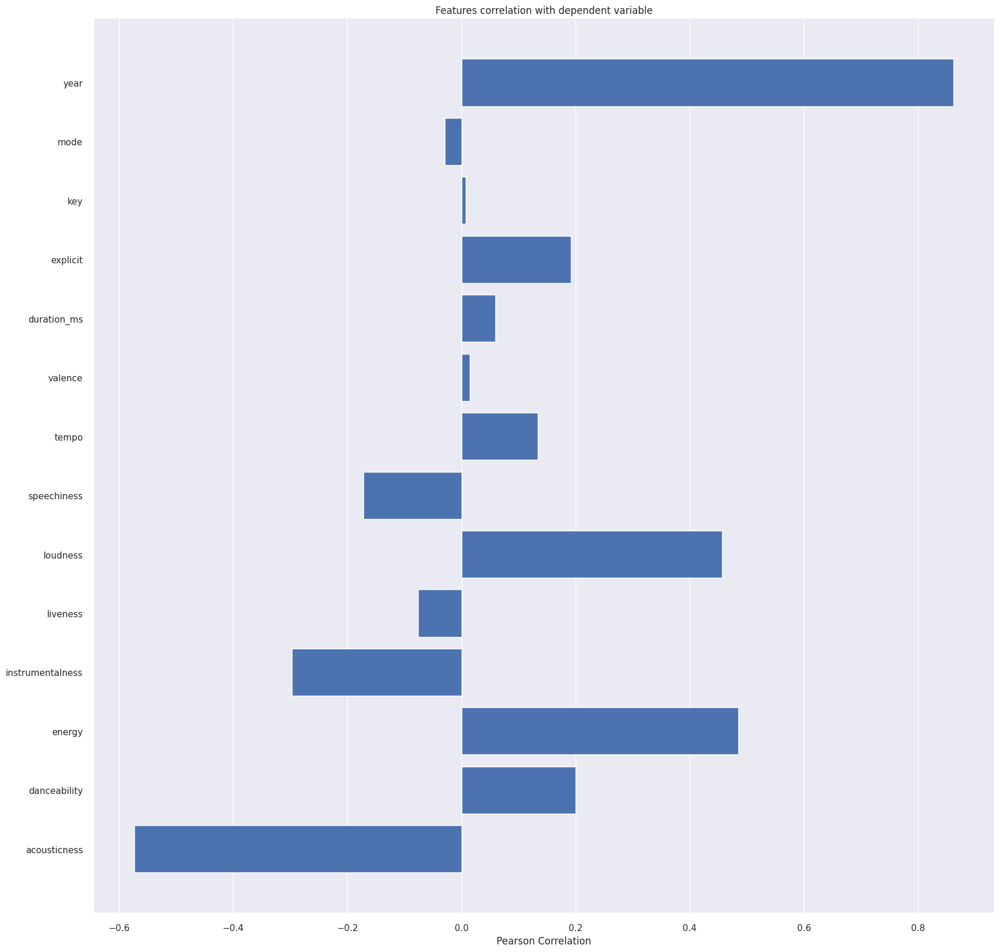

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
# Feature names that will be used for correlation analysis
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
                 'liveness', 'loudness', 'speechiness', 'tempo', 'valence',
                 'duration_ms', 'explicit', 'key', 'mode', 'year']

# Split the dataset into features (X) and target (y)
X, y = data[feature_names], data['popularity']

# Convert the feature names into a numpy array (optional for labeling in visualizer)
features = np.array(feature_names)

# Instantiate the FeatureCorrelation visualizer with feature labels
visualizer = FeatureCorrelation(labels=features)

# Adjust figure size to make it larger and more readable
plt.rcParams['figure.figsize'] = (20, 20)

# Fit the visualizer to the data and display the plot
visualizer.fit(X, y)  # Fit the data to the visualizer
visualizer.show()  # Display the feature correlation plot

<Axes: xlabel='count', ylabel='decade'>

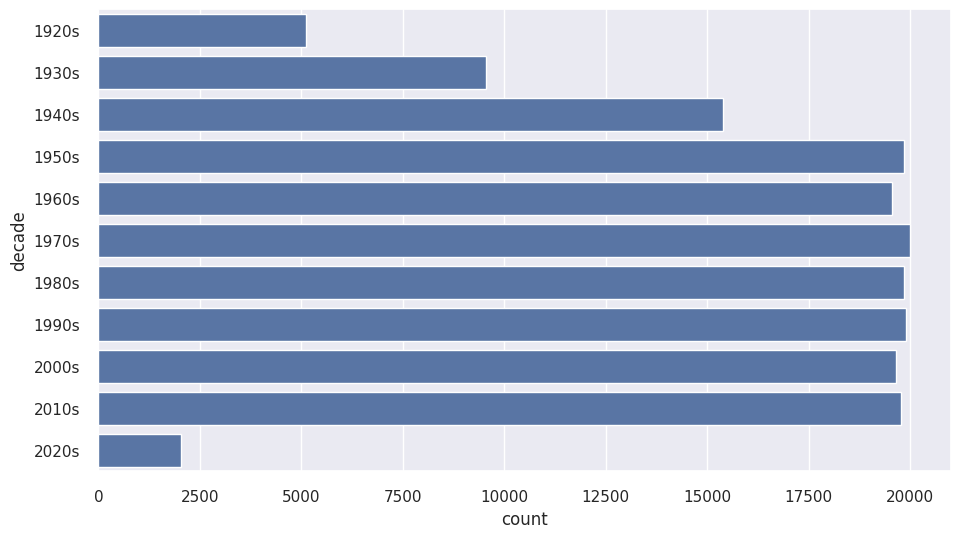

In [ ]:
# Function to calculate the decade from the year
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

# Adding a new column 'decade' based on the 'year' column
data['decade'] = data['year'].apply(get_decade)

# Visualizing the count of songs per decade
sns.set(rc={'figure.figsize':(11, 6)})  # Set plot size
sns.countplot(data['decade'])  # Count plot for the number of songs in each decade

In [ ]:
# List of sound features to be visualized
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

# Line plot of sound features over the years
fig = px.line(year_data, x='year', y=sound_features)
fig.show()  # Show the plot


In [ ]:
# Selecting top 10 genres based on popularity
top10_genres = genre_data.nlargest(10, 'popularity')

# Grouped bar chart for different sound features by genres
fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()  # Show the plot


In [ ]:
# Clustering pipeline using StandardScaler and KMeans
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])

# Selecting only numerical columns for clustering
X = genre_data.select_dtypes(np.number)

# Fitting the clustering pipeline
cluster_pipeline.fit(X)

# Adding the resulting cluster labels to the genre_data dataset
genre_data['cluster'] = cluster_pipeline.predict(X)


In [ ]:
# Pipeline for t-SNE dimensionality reduction
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])

# Fitting and transforming the data into 2D using t-SNE
genre_embedding = tsne_pipeline.fit_transform(X)

# Creating a DataFrame for the 2D projection
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']  # Add genre labels
projection['cluster'] = genre_data['cluster']  # Add cluster labels

# Scatter plot to visualize clusters with t-SNE projection
fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()  # Show the plot


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.261s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.102409
[t-SNE] KL divergence after 1000 iterations: 1.393050


In [ ]:
#Clustering Songs With K-Means
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

# Replace with your actual client ID and secret
client_id = "4f94d8fa8731489996ebc6a0a4b9e294"
client_secret = "f4f585207dbc411baed16847702ac78b"

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=client_id,
                                                           client_secret=client_secret))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
def get_mean_vector(song_list, spotify_data):
    """
    Calculates the mean feature vector for a list of songs.

    Args:
        song_list (list): A list of dictionaries, where each dictionary
                          represents a song with 'name' and 'year' keys.
        spotify_data (pd.DataFrame): DataFrame containing song data.

    Returns:
        np.array: The mean feature vector of the songs.
                  Returns None if no valid song vectors are found.
    """
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        # Ensure song_data has all number_cols before extracting values
        if all(col in song_data.index for col in number_cols):
            song_vector = song_data[number_cols].values
            song_vectors.append(song_vector)
        else:
            print(f"Warning: Song {song['name']} is missing some features.")

    # Check if any valid song vectors were found
    if not song_vectors:
        print("Error: No valid song vectors found.")
        return None

    song_matrix = np.array(song_vectors)
    return np.mean(song_matrix, axis=0)

In [ ]:
recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  data)

[{'name': 'Hanging By A Moment', 'year': 2000, 'artists': "['Lifehouse']"},
 {'name': 'Kiss Me', 'year': 1997, 'artists': "['Sixpence None The Richer']"},
 {'name': "Breakfast At Tiffany's",
  'year': 1995,
  'artists': "['Deep Blue Something']"},
 {'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"},
 {'name': "It's Not Living (If It's Not With You)",
  'year': 2018,
  'artists': "['The 1975']"},
 {'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"},
 {'name': 'Wherever You Will Go', 'year': 2001, 'artists': "['The Calling']"},
 {'name': 'Ballbreaker', 'year': 1995, 'artists': "['AC/DC']"},
 {'name': 'Runaway (U & I)', 'year': 2015, 'artists': "['Galantis']"},
 {'name': "Club Can't Handle Me (feat. David Guetta)",
  'year': 2010,
  'artists': "['Flo Rida', 'David Guetta']"}]